## Load the MS COCO Dataset

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from torchvision.transforms import Compose, ToTensor, Normalize, Resize
from torchvision.models import resnet18
import torch.optim as optim
import torch.nn as nn

# Define your transformation pipeline
transform = Compose([
    Resize((224, 224)),  # Resize images to match ResNet input size
    ToTensor(),  # Converts PIL image or numpy.ndarray to tensor
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizes the image
])

# Paths to your COCO annotations and image directory
ann_file = './coco2017/annotations/instances_train2017.json'  # Replace with your annotation file path
img_folder = './coco2017/train2017'  # Replace with your images folder path

# Load the dataset
train_dataset = CocoDetection(root=img_folder, annFile=ann_file, transform=transform)

# Define batch size
batch_size = 4

# Create DataLoader
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=lambda x: tuple(zip(*x))  # Custom collate function to handle COCO format
)

# Define the model
model = resnet18(pretrained=True)  # Load a pre-trained ResNet18 model
num_classes = 80  # COCO has 80 classes
model.fc = nn.Linear(model.fc.in_features, num_classes)  # Replace the final fully connected layer

# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [ ]:
# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for imgs, targets in train_dataloader:
        # Move images to GPU
        imgs = [img.to(device) for img in imgs]

        # Prepare targets (ensure all targets are on the same device)
        targets = [torch.tensor([ann['category_id'] for ann in target]).to(device) for target in targets]

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = [model(img.unsqueeze(0)) for img in imgs]
        outputs = torch.cat(outputs, dim=0).to(device)

        # Ensure targets are on the same device as outputs
        targets = torch.cat([torch.zeros(output.size(0), dtype=torch.long, device=device) for output in outputs])

        # Calculate loss
        loss = sum([criterion(output, target) for output, target in zip(outputs, targets)])
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_dataloader)
    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}')


In [ ]:
torch.save(model.state_dict(), 'resnet18_coco.pth')

loading annotations into memory...
Done (t=0.41s)
creating index...
index created!
Image: 000000397133.jpg
Top 5 predictions (class indices): [634 762 827 788 617]


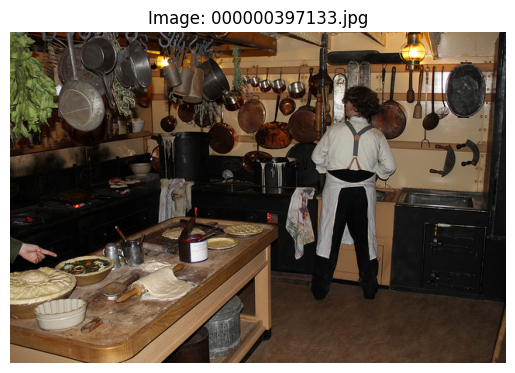

Image: 000000037777.jpg
Top 5 predictions (class indices): [651 760 827 556 598]


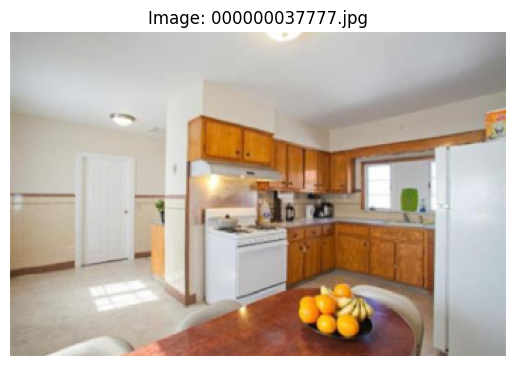

Image: 000000252219.jpg
Top 5 predictions (class indices): [840 523 571 822 424]


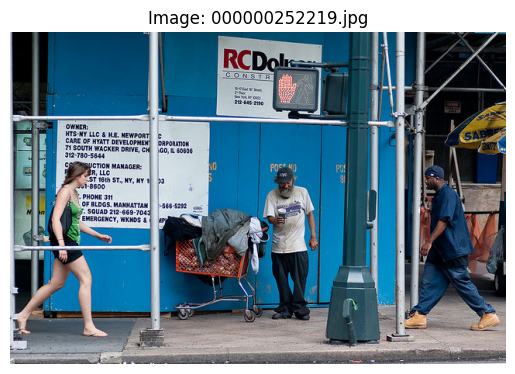

Image: 000000087038.jpg
Top 5 predictions (class indices): [880 870 462 704 571]


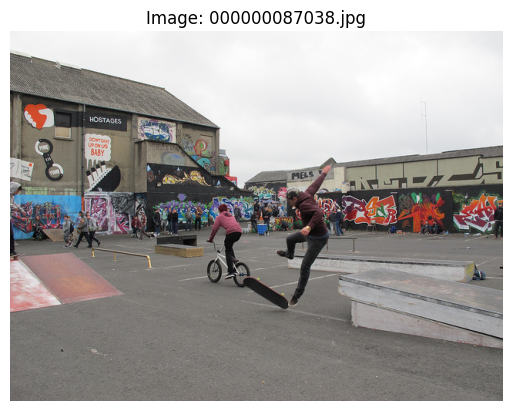

Image: 000000174482.jpg
Top 5 predictions (class indices): [671 880 665 444 870]


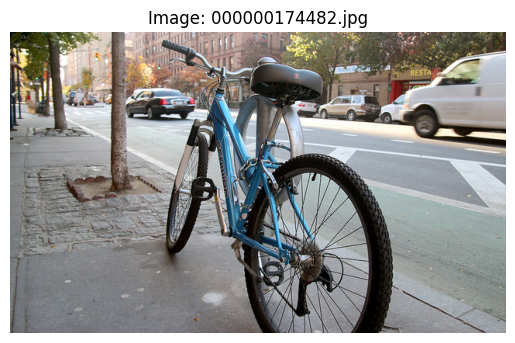

Image: 000000403385.jpg
Top 5 predictions (class indices): [861 896 731 897 648]


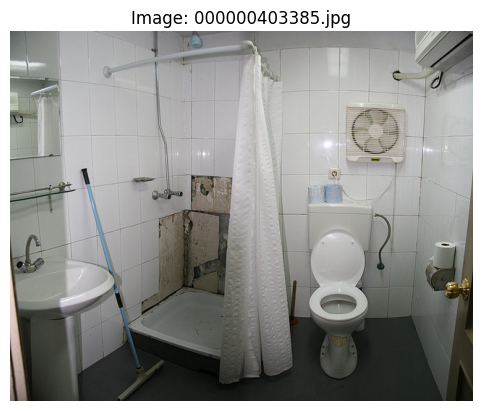

Image: 000000006818.jpg
Top 5 predictions (class indices): [999 861 756 896 700]


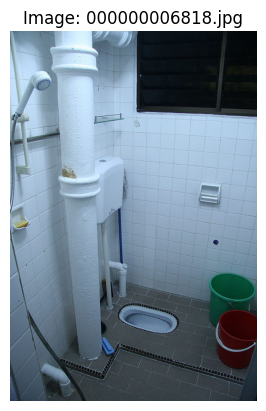

Image: 000000480985.jpg
Top 5 predictions (class indices): [670 665 581 479 661]


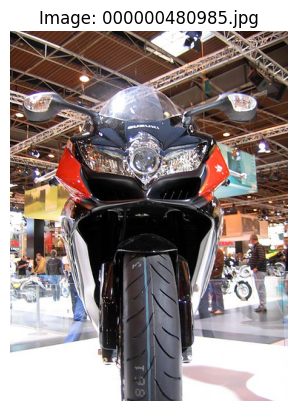

Image: 000000458054.jpg
Top 5 predictions (class indices): [876 472 435 389 144]


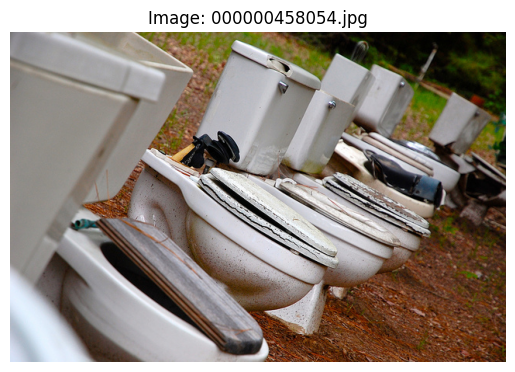

Image: 000000331352.jpg
Top 5 predictions (class indices): [861 435 999 876 897]


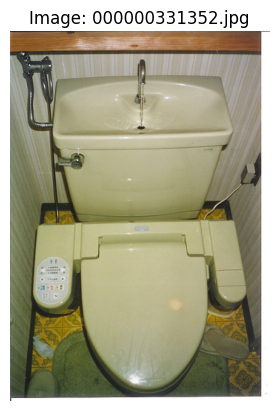

In [12]:
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet18
from torchvision.datasets import CocoDetection
from pycocotools.coco import COCO
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the transformation to preprocess the images
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load the pretrained ResNet18 model
model = resnet18(pretrained=True)
model.eval()

# Load COCO dataset
# ann_file = './coco2017/annotations/instances_train2017.json'  # Replace with your annotation file path
# img_folder = './coco2017/train2017'  # Replace with your images folder path

data_dir = './coco2017'  # Replace with the path to your COCO dataset
ann_file = './coco2017/annotations/instances_val2017.json'
coco = COCO(ann_file)

# Load the first 10 image IDs
image_ids = coco.getImgIds()[:10]
images = coco.loadImgs(image_ids)

# Prepare for inference
results = []

for img_info in images:
    img_id = img_info['id']
    img_path = f'{data_dir}/val2017/{img_info["file_name"]}'
    
    # Load and preprocess the image
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension
    
    # Perform inference
    with torch.no_grad():
        outputs = model(img_tensor)
    
    # Get top 5 predictions
    _, predicted = torch.topk(outputs, 5)
    predicted = predicted[0].cpu().numpy()
    
    # Store results
    results.append({
        'file_name': img_info['file_name'],
        'predictions': predicted
    })

# Print and plot results
for result in results:
    print(f"Image: {result['file_name']}")
    print(f"Top 5 predictions (class indices): {result['predictions']}")
    
    # Plot the image
    img_path = f'{data_dir}/val2017/{result["file_name"]}'
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(f"Image: {result['file_name']}")
    plt.axis('off')
    plt.show()


loading annotations into memory...
Done (t=0.49s)
creating index...
index created!
Image: 000000397133.jpg
Top 5 predictions (class indices): [634 762 827 788 617]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


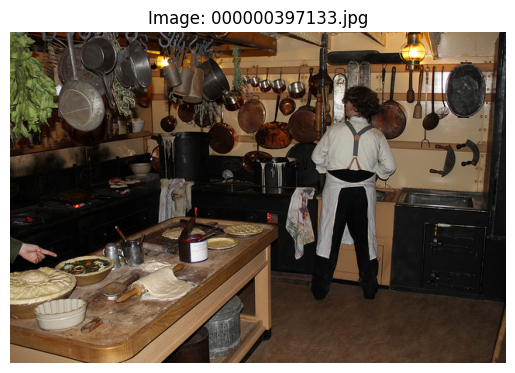

Image: 000000037777.jpg
Top 5 predictions (class indices): [651 760 827 556 598]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


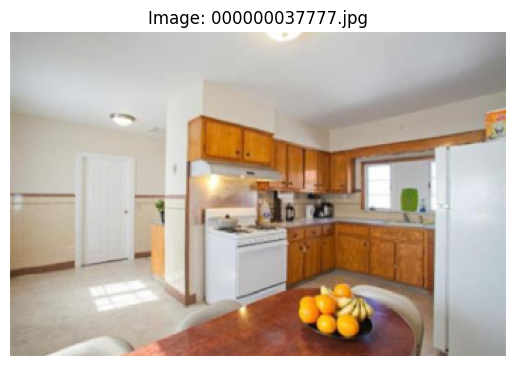

Image: 000000252219.jpg
Top 5 predictions (class indices): [840 523 571 822 424]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


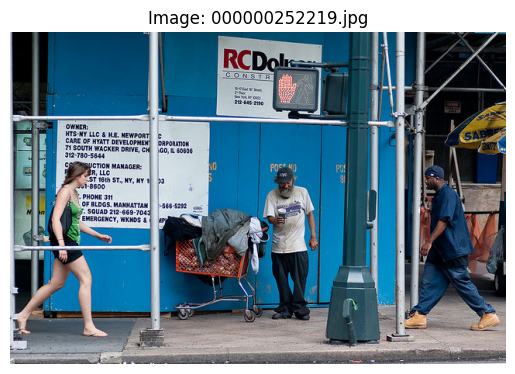

Image: 000000087038.jpg
Top 5 predictions (class indices): [880 870 462 704 571]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


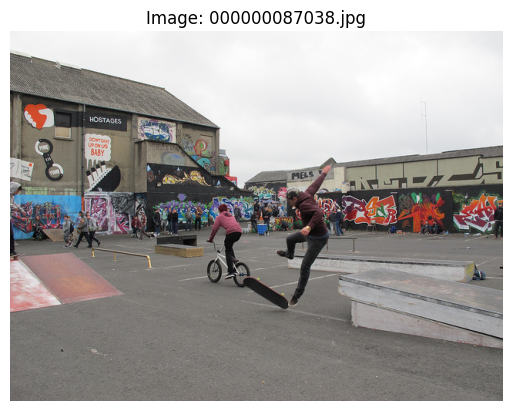

Image: 000000174482.jpg
Top 5 predictions (class indices): [671 880 665 444 870]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


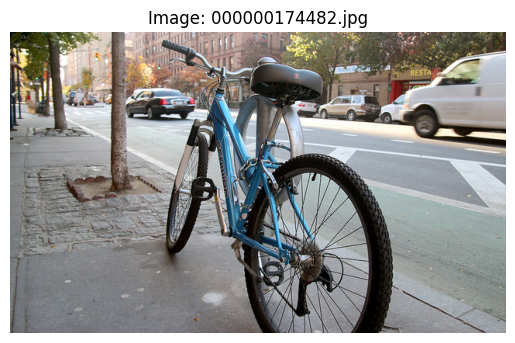

Image: 000000403385.jpg
Top 5 predictions (class indices): [861 896 731 897 648]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


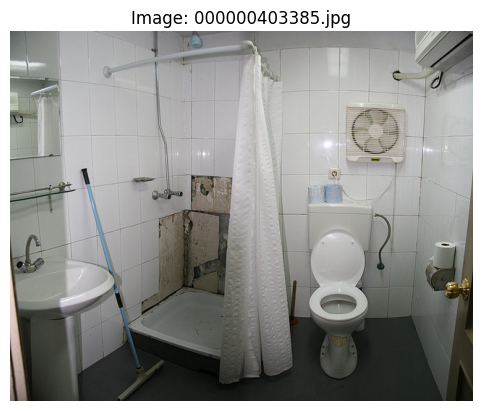

Image: 000000006818.jpg
Top 5 predictions (class indices): [999 861 756 896 700]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


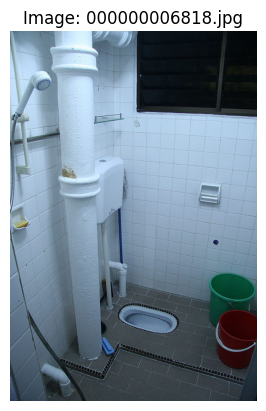

Image: 000000480985.jpg
Top 5 predictions (class indices): [670 665 581 479 661]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


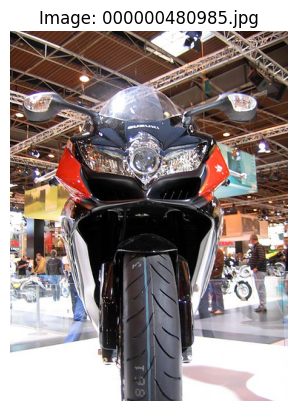

Image: 000000458054.jpg
Top 5 predictions (class indices): [876 472 435 389 144]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


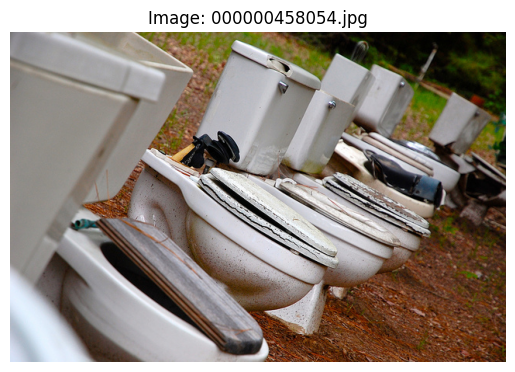

Image: 000000331352.jpg
Top 5 predictions (class indices): [861 435 999 876 897]
Top 5 predictions (class names): ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


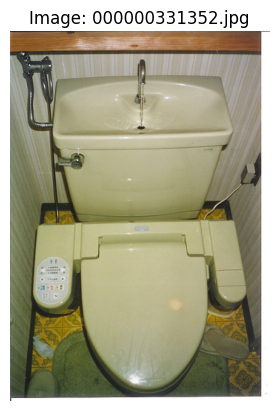

In [13]:
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet18
from pycocotools.coco import COCO
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the transformation to preprocess the images
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load the pretrained ResNet18 model
model = resnet18(pretrained=True)
model.eval()

# Load COCO dataset
data_dir = './coco2017'  # Replace with the path to your COCO dataset
ann_file = f'{data_dir}/annotations/instances_val2017.json'
coco = COCO(ann_file)

# Load COCO class names
category_info = coco.loadCats(coco.getCatIds())
category_names = {cat['id']: cat['name'] for cat in category_info}

# Load the first 10 image IDs
image_ids = coco.getImgIds()[:10]
images = coco.loadImgs(image_ids)

# Prepare for inference
results = []

for img_info in images:
    img_id = img_info['id']
    img_path = f'{data_dir}/val2017/{img_info["file_name"]}'
    
    # Load and preprocess the image
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension
    
    # Perform inference
    with torch.no_grad():
        outputs = model(img_tensor)
    
    # Get top 5 predictions
    _, predicted = torch.topk(outputs, 5)
    predicted = predicted[0].cpu().numpy()
    
    # Store results
    results.append({
        'file_name': img_info['file_name'],
        'predictions': predicted
    })

# Print and plot results
for result in results:
    print(f"Image: {result['file_name']}")
    print(f"Top 5 predictions (class indices): {result['predictions']}")
    
    # Convert predictions to COCO class names
    top_preds = result['predictions']
    top_preds_names = [category_names.get(idx, 'Unknown') for idx in top_preds]
    print(f"Top 5 predictions (class names): {top_preds_names}")
    
    # Plot the image
    img_path = f'{data_dir}/val2017/{result["file_name"]}'
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(f"Image: {result['file_name']}")
    plt.axis('off')
    plt.show()


## Pre-trained

/home/mllab/anaconda3/envs/k8smscoco/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/mllab/anaconda3/envs/k8smscoco/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loading annotations into memory...
Done (t=1.26s)
creating index...
index created!
Labels: ['person', 'person', 'sink', 'bowl', 'bowl', 'spoon', 'spoon', 'spoon', 'spoon', 'spoon', 'bowl', 'spoon', 'bowl', 'cup', 'spoon', 'bowl', 'spoon', 'oven', 'dining table', 'potted plant', 'spoon', 'spoon', 'spoon', 'backpack']
Scores: [0.9996867  0.9908845  0.9791108  0.9779758  0.97611713 0.957265
 0.94993037 0.9265658  0.9025016  0.8950327  0.89257747 0.8092731
 0.789869   0.6689773  0.60828704 0.5785264  0.5603286  0.5534408
 0.5531974  0.54024935 0.5332454  0.51346594 0.5101636  0.50118464]


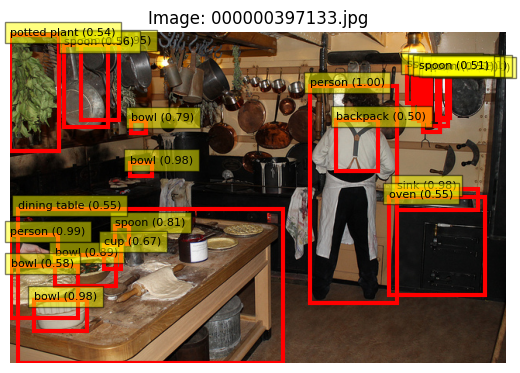

Labels: ['refrigerator', 'oven', 'banana', 'orange', 'orange', 'orange', 'dining table', 'orange', 'orange', 'bottle', 'bottle', 'orange', 'bottle', 'potted plant', 'sink', 'banana', 'sink', 'bowl', 'sink', 'orange']
Scores: [0.99622643 0.98947865 0.9656908  0.9618281  0.9550204  0.9497869
 0.92613184 0.8783141  0.86622983 0.865825   0.82075727 0.80707
 0.77502596 0.7402194  0.7021942  0.68858564 0.5728669  0.54794735
 0.5197781  0.5001351 ]


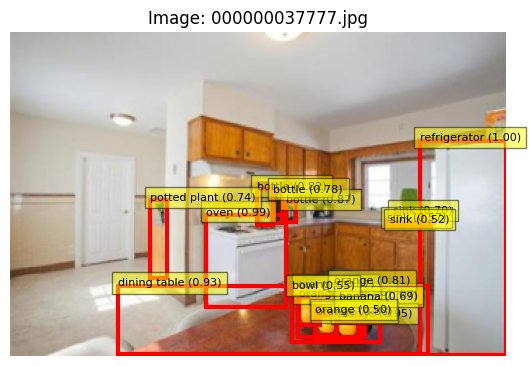

Labels: ['person', 'person', 'person', 'traffic light', 'umbrella', 'backpack', 'cup', 'backpack', 'backpack']
Scores: [0.9997774  0.9989588  0.9986688  0.9699775  0.92859954 0.8872347
 0.8061788  0.7686072  0.70025086]


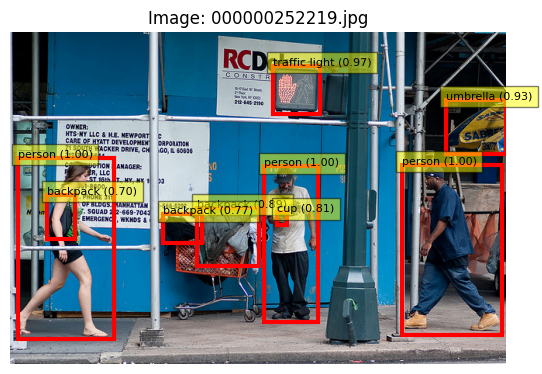

Labels: ['person', 'person', 'bicycle', 'person', 'person', 'person', 'skateboard', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'clock', 'person', 'skateboard', 'person', 'person', 'person', 'bench', 'person', 'person', 'person', 'clock']
Scores: [0.99895895 0.9984804  0.99447787 0.98612136 0.98297876 0.97125006
 0.955413   0.942795   0.9364794  0.908654   0.9054271  0.8948914
 0.8852998  0.87723815 0.82789975 0.7936841  0.75766736 0.740407
 0.73059815 0.7277488  0.69016933 0.6065026  0.56618035 0.5660797
 0.5200519  0.51476574]


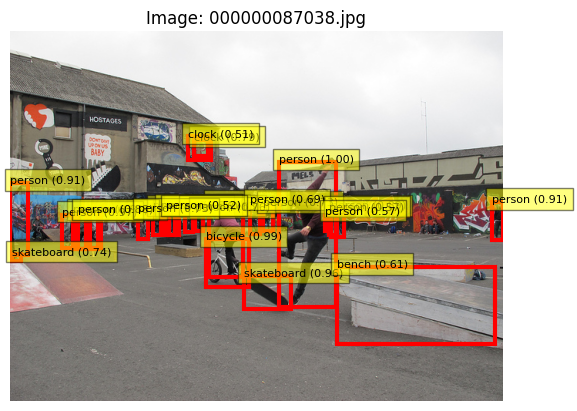

Labels: ['car', 'bicycle', 'car', 'car', 'car', 'car', 'car', 'car', 'traffic light', 'car', 'traffic light', 'car', 'traffic light', 'car', 'car']
Scores: [0.9825963  0.98208284 0.9722262  0.9432274  0.94318676 0.9173097
 0.91087663 0.9062657  0.8844584  0.883844   0.8348532  0.70716393
 0.6990964  0.5896163  0.5017379 ]


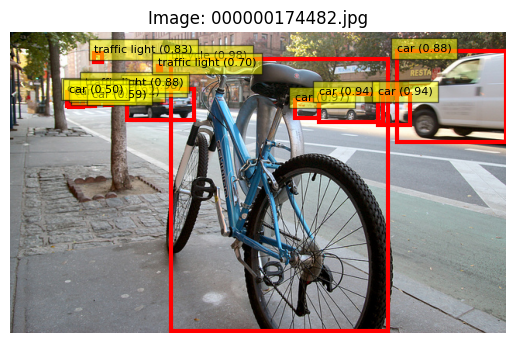

Labels: ['sink', 'toilet', 'cup', 'cup', 'bottle']
Scores: [0.9966329  0.99244446 0.9119194  0.8436536  0.7875514 ]


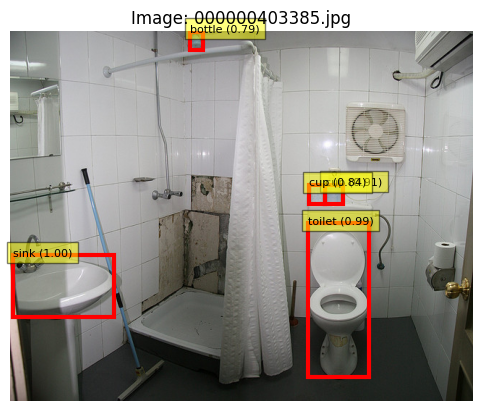

Labels: ['toilet']
Scores: [0.9337543]


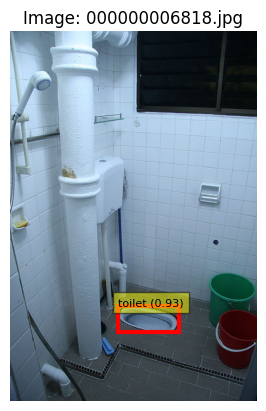

Labels: ['person', 'person', 'motorcycle', 'person', 'person', 'person', 'motorcycle', 'motorcycle', 'spoon', 'bowl', 'person', 'motorcycle', 'motorcycle', 'backpack']
Scores: [0.9971397  0.9873975  0.9736342  0.96682245 0.95872104 0.9523429
 0.94556004 0.86409754 0.7803974  0.75974005 0.73828864 0.7079931
 0.6014733  0.50722545]


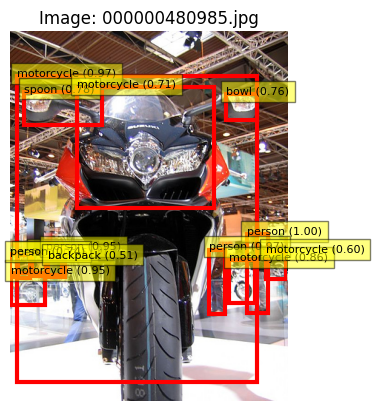

Labels: ['toilet', 'toilet', 'toilet', 'toilet', 'toilet', 'toilet', 'sink', 'sink']
Scores: [0.9351105  0.9251836  0.83122164 0.7947881  0.7279023  0.69940585
 0.5304665  0.5012095 ]


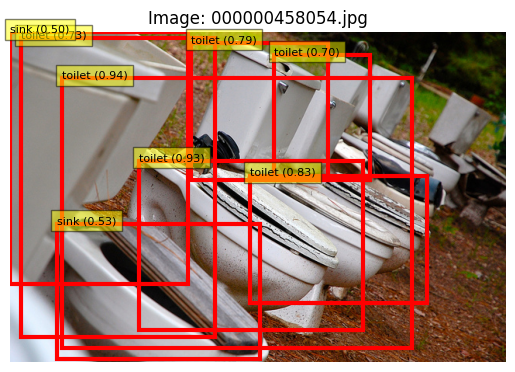

Labels: ['toilet', 'sink', 'sink', 'toilet']
Scores: [0.9929444  0.8763284  0.80306244 0.65725267]


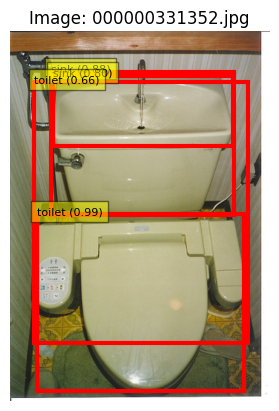

In [1]:
import torch
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from pycocotools.coco import COCO
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the transformation to preprocess the images
def transform_image(image):
    image = F.to_tensor(image)
    return image

# Load the pretrained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Load COCO dataset
data_dir = './coco2017'  # Replace with the path to your COCO dataset
ann_file = f'{data_dir}/annotations/instances_val2017.json'
coco = COCO(ann_file)

# Load COCO class names
category_info = coco.loadCats(coco.getCatIds())
category_names = {cat['id']: cat['name'] for cat in category_info}

# Load the first 10 image IDs
image_ids = coco.getImgIds()[:10]
images = coco.loadImgs(image_ids)

# Prepare for inference
results = []

for img_info in images:
    img_id = img_info['id']
    img_path = f'{data_dir}/val2017/{img_info["file_name"]}'
    
    # Load and preprocess the image
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform_image(img).unsqueeze(0)  # Add batch dimension
    
    # Perform inference
    with torch.no_grad():
        predictions = model(img_tensor)[0]
    
    # Extract predictions
    boxes = predictions['boxes'].cpu().numpy()
    labels = predictions['labels'].cpu().numpy()
    scores = predictions['scores'].cpu().numpy()
    
    # Filter out predictions with low confidence
    high_conf_idx = np.where(scores > 0.5)[0]  # Confidence threshold of 0.5
    boxes = boxes[high_conf_idx]
    labels = labels[high_conf_idx]
    scores = scores[high_conf_idx]
    
    # Store results
    results.append({
        'file_name': img_info['file_name'],
        'boxes': boxes,
        'labels': labels,
        'scores': scores
    })

# Print and plot results
for result in results:
    # print(f"Image: {result['file_name']}")
    # print(f"Boxes: {result['boxes']}")
    print(f"Labels: {[category_names.get(label, 'Unknown') for label in result['labels']]}")
    print(f"Scores: {result['scores']}")
    
    # Plot the image with bounding boxes
    img_path = f'{data_dir}/val2017/{result["file_name"]}'
    img = Image.open(img_path)
    plt.imshow(img)
    ax = plt.gca()
    
    for box, label, score in zip(result['boxes'], result['labels'], result['scores']):
        rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], 
                             fill=False, color='red', linewidth=3)
        ax.add_patch(rect)
        plt.text(box[0], box[1], f'{category_names.get(label, "Unknown")} ({score:.2f})', 
                 bbox=dict(facecolor='yellow', alpha=0.5), fontsize=8, color='black')
    plt.title(f"Image: {result['file_name']}")
    plt.axis('off')
    plt.show()


In [4]:
torch.save(model.state_dict(), 'coco_predictions.pth')

## Crawl icon

In [3]:
import requests
import os

# List of image IDs to download
image_ids = [i for i in range(1, 92)]

# Base URL for downloading images
base_url = 'https://cocodataset.org/images/cocoicons/'

# Directory to save the images
save_dir = '/home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa'
os.makedirs(save_dir, exist_ok=True)

for image_id in image_ids:
    # Construct the URL and file path
    img_url = f'{base_url}{image_id}.jpg'
    img_path = os.path.join(save_dir, f'{image_id}.jpg')
    
    # Download the image
    try:
        response = requests.get(img_url)
        response.raise_for_status()  # Check for HTTP errors
        
        with open(img_path, 'wb') as file:
            file.write(response.content)
        print(f'Downloaded: {img_path}')
    except requests.RequestException as e:
        print(f'Failed to download image {image_id}.jpg. Error: {e}')


Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/1.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/2.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/3.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/4.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/5.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/6.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/7.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/8.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/9.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/10.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/aa/11.jpg
Downloaded: /home/mllab/Desktop/K8S-Lab-Image-Classification-We

In [4]:
import os

# Directory containing the images
image_dir = '/home/mllab/Desktop/K8S-Lab-Image-Classification-Website/static/mscoco'

# List all files in the directory
files = sorted(os.listdir(image_dir), key=lambda x: int(os.path.splitext(x)[0]))

# Rename each file
for i, file in enumerate(files, start=1):
    # Create the new filename
    ext = os.path.splitext(file)[1]
    new_name = f'{i}{ext}'
    
    # Get full path for the current file and the new file
    old_path = os.path.join(image_dir, file)
    new_path = os.path.join(image_dir, new_name)
    
    # Rename the file
    os.rename(old_path, new_path)

print("Renaming complete!")


Renaming complete!
